<a href="https://colab.research.google.com/github/askinsj2022/Jacob-Askins-Math-24/blob/main/Jacob_Askins_Final_Project_Notebook_Hahn_Stats_24.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Final Project Notebook - Spring 2024

In [ ]:
import matplotlib.pyplot as plt #Imports `matplotlib` for plotting.
import imageio #Imports `imageio` for image handling.
import torch   #Imports `PyTorch` for deep learning.
import torchvision   #Imports `torchvision` for image tasks.
from torchvision import models, transforms  #Imports models, transforms from `torchvision`.
import numpy as np   #Imports `NumPy` for numerical operations.
from torchvision.models import *  #Imports all from `torchvision.models`.
from PIL import Image  #Imports `Image` from `PIL` for image processing.
import requests #Imports `requests` for HTTP requests.
from torchvision import models #Imports `models` from `torchvision`.
from torchsummary import summary #Imports `summary` from `torchsummary` for model summaries.

These lines of code import a variety of libraries and modules crucial for tasks related to data visualization, image processing, deep learning, and web requests, enabling the handling of complex data analysis, manipulation, and model evaluation tasks within Python. Libraries such as `matplotlib`, `torch`, and `PIL` are used for plotting graphs, performing deep learning operations, and processing images, respectively, while `requests` facilitates HTTP communication.

In [ ]:
def plot(x):
    fig, ax = plt.subplots()  # Create a figure and a set of subplots (one subplot here).
    im = ax.imshow(x, cmap='gray')  # Display the image x in grayscale.
    ax.axis('off')  # Turn off the axis to only show the image.
    fig.set_size_inches(20, 20)  # Set the figure size to 20x20 inches.
    plt.show()  # Display the figure containing the image.

This function `plot` is designed to display an image within a large 20x20 inch figure using `matplotlib`. It starts by creating a figure and a single subplot using `plt.subplots()`. The image data `x` is then displayed in grayscale using `ax.imshow()`, specifying `cmap='gray'` to apply the grayscale color mapping. The axes are hidden with `ax.axis('off')` to focus solely on the image, and the figure size is set to 20 inches by 20 inches to ensure the image is clearly visible and appropriately scaled. Finally, `plt.show()` is called to render the figure on the screen. This setup is particularly useful for detailed inspections of images in analysis and presentations.

In [ ]:
im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')  # Read an image from a URL and store it in the variable 'im'.

<ipython-input-3-2086ec9e0cf6>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')


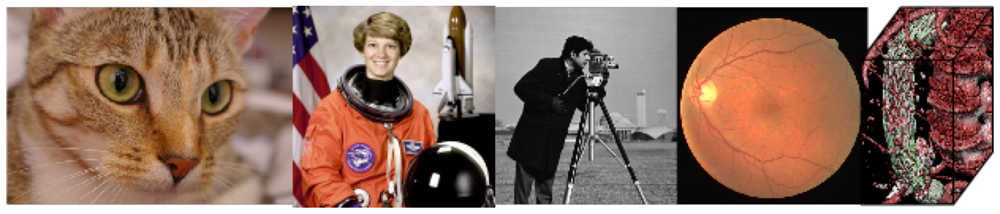

In [ ]:
plot(im)  # Call the plot function defined earlier to display the image stored in 'im'.

In [ ]:
net = alexnet(pretrained=True).cuda(0)  # Load a pretrained AlexNet model and move it to GPU device at index 0.

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:06<00:00, 35.9MB/s]


In [ ]:
# Define a normalization transformation using specified mean and standard deviation for each color channel.
normalize = transforms.Normalize(
   mean=[0.485, 0.456, 0.406],  # Specify the mean for normalizing each of the three color channels (RGB).
   std=[0.229, 0.224, 0.225]    # Specify the standard deviations for normalizing each of the three color channels.
)

# Define a series of transformations to preprocess the input images.
preprocess = transforms.Compose([
   transforms.Resize(256),      # Resize the input image to 256x256 pixels, maintaining aspect ratio.
   transforms.CenterCrop(224),  # Crop the resized image at the center to get a 224x224 pixel image.
   transforms.ToTensor(),       # Convert the cropped image to a PyTorch tensor.
   normalize                    # Apply the normalization transformation defined earlier to the tensor.
])

This code defines a set of image preprocessing transformations for computer vision tasks. It starts by resizing images to 256x256 pixels, then crops them to 224x224 at the center. Images are converted to PyTorch tensors and normalized by adjusting their RGB channels' mean and standard deviation, ensuring they match the expected format for many pre-trained models.

In [ ]:
im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg')  # Read an image of a golden retriever puppy from the specified URL and store it in the variable 'im'.

<ipython-input-7-772805ffc2cf>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg')


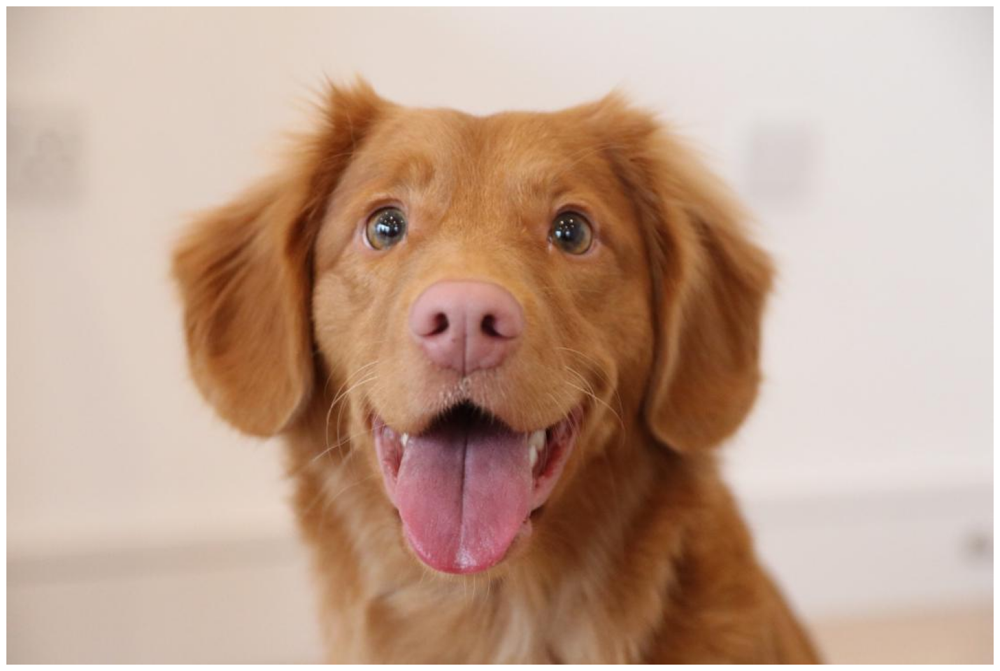

In [ ]:
plot(im) # Call the plot function defined earlier to display the image stored in 'im'.

In [ ]:
image = Image.fromarray(im)  # Convert the array 'im' (image data) into a PIL Image object stored in the variable 'image'.

In [ ]:
img_tensor = preprocess(image)  # Apply the predefined 'preprocess' transformation sequence to the PIL image 'image' and store the resulting tensor in 'img_tensor'.

In [ ]:
img_tensor = img_tensor.unsqueeze_(0)  # Add an extra dimension at the beginning of the tensor 'img_tensor' to create a batch dimension, modifying the tensor in-place.

In [ ]:
img_tensor.shape  # Retrieve and display the shape of the tensor 'img_tensor' after adding the batch dimension.

torch.Size([1, 3, 224, 224])

In [ ]:
img_variable = torch.tensor(img_tensor).cuda(0)  # Convert the tensor 'img_tensor' to a new PyTorch tensor and move it to the GPU at index 0, storing it in 'img_variable'.

<ipython-input-13-a3c4eb55103d>:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


In [ ]:
out = net(img_variable)  # Pass the tensor 'img_variable' through the neural network 'net' to get the output 'out'.

In [ ]:
label_index = out.cpu().data.numpy().argmax()  # Move the output tensor 'out' to CPU, convert it to a numpy array, and find the index of the maximum value.

In [ ]:
label_index  # Retrieve and display the value of 'label_index', which holds the index of the maximum output from the model.

207

In [ ]:
top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:])  # Extract the top 10 predictions from the model output 'out' by sorting, reversing the order, and selecting the last 10 indices.

In [ ]:
LABELS_URL = 'https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json'  # Define a constant 'LABELS_URL' that stores the URL of a JSON file containing label names.

In [ ]:
labels = {int(key):value for (key, value) in requests.get(LABELS_URL).json().items()}  # Fetch the JSON data from 'LABELS_URL', convert it into a dictionary with integer keys and string values.

In [ ]:
print(labels[label_index])  # Print the class label corresponding to the predicted class index 'label_index'.

golden retriever


In [ ]:
for i in range(10):  # Loop over the range of 10 to access the first 10 elements.
    print(labels[top_list[i]])  # Print the class label corresponding to each index in 'top_list'.

golden retriever
Brittany spaniel
Sussex spaniel
chow, chow chow
Irish setter, red setter
Tibetan mastiff
cocker spaniel, English cocker spaniel, cocker
vizsla, Hungarian pointer
tennis ball
Labrador retriever


In [ ]:
net  # Reference to the neural network model, specifically a pretrained AlexNet, loaded and configured to run on GPU.

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [ ]:
summary(net, (3, 224, 224))  # Display a detailed summary of the 'net' model, including each layer's outputs and the number of parameters, for input images of shape (3, 224, 224).

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 55, 55]          23,296
              ReLU-2           [-1, 64, 55, 55]               0
         MaxPool2d-3           [-1, 64, 27, 27]               0
            Conv2d-4          [-1, 192, 27, 27]         307,392
              ReLU-5          [-1, 192, 27, 27]               0
         MaxPool2d-6          [-1, 192, 13, 13]               0
            Conv2d-7          [-1, 384, 13, 13]         663,936
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 256, 13, 13]         884,992
             ReLU-10          [-1, 256, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         590,080
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13            [-1, 256, 6, 6]               0
AdaptiveAvgPool2d-14            [-1, 25

In [ ]:
out = net.features[0](img_variable).cpu().detach().numpy()  # Apply first layer, move to CPU, detach, to numpy.

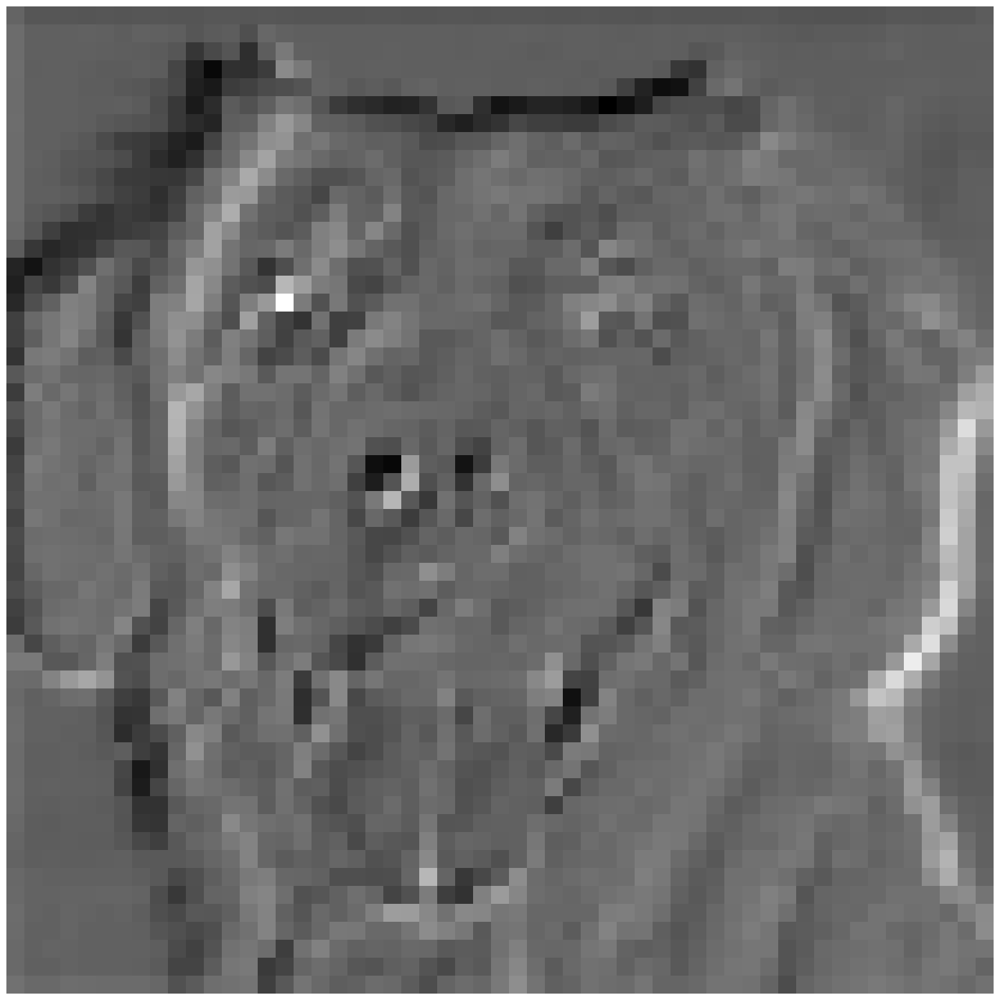

In [ ]:
plot(out[0, 0, :, :])  # Display the first feature map of the first output.


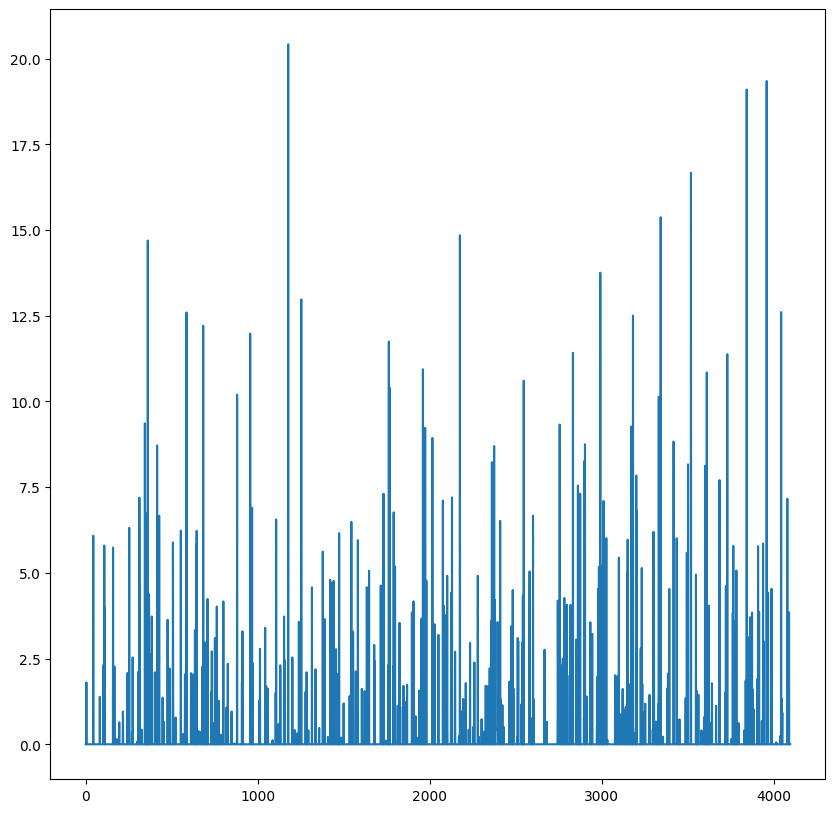

In [ ]:
# Process through layers, flatten, plot classifier output.
plt.plot(np.arange(4096), net.classifier[0:6](net.avgpool(net.features[0:13](img_variable)).flatten()).cpu().detach().numpy())
fig = plt.gcf()  # Get current figure.
fig.set_size_inches(10, 10)  # Set figure size to 10x10 inches.

In [ ]:
im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')  # Load image from URL.

<ipython-input-27-db4016f420a5>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')


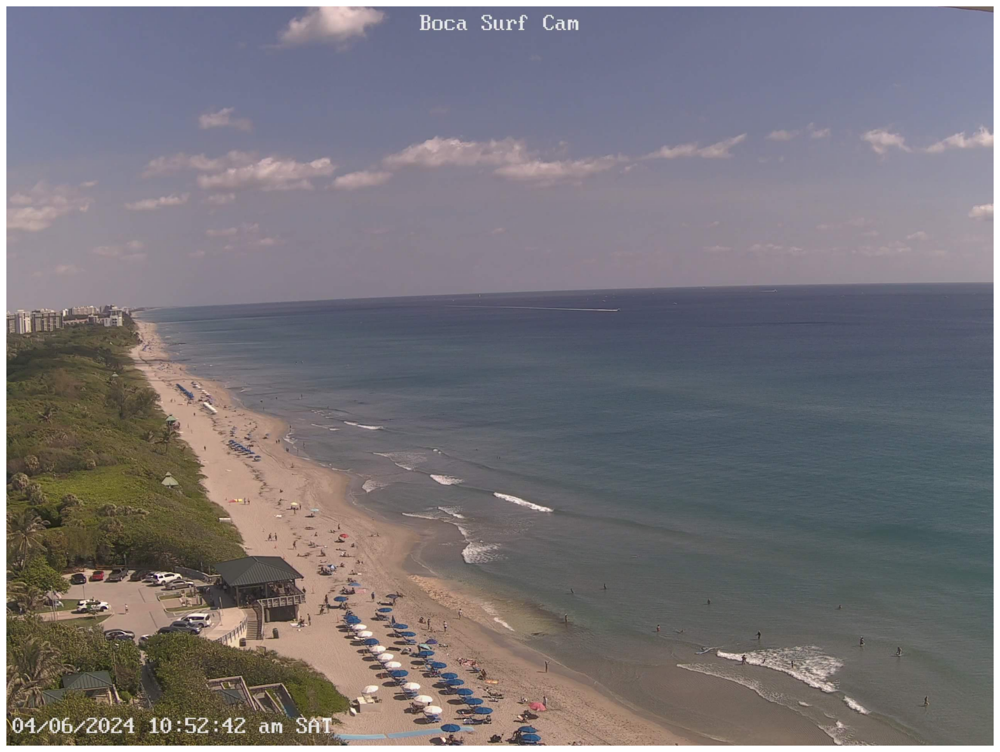

In [ ]:
plot(im)  # Display the loaded image.

In [ ]:
def load_im(im):
    image = Image.fromarray(im)  # Convert numpy array to PIL Image for compatibility with PyTorch transforms.
    img_tensor = preprocess(image)  # Apply predefined transformations like resizing, cropping, and normalization.
    img_tensor = img_tensor.unsqueeze_(0)  # Add a batch dimension to the tensor for model input compatibility.
    img_variable = torch.tensor(img_tensor).cuda(0)  # Convert to tensor, ensure it's on GPU for faster processing.
    return img_variable  # Return the fully processed tensor ready for neural network input.

The `load_im` function converts a numpy array to a PIL Image, ensuring compatibility with PyTorch's image processing operations. It then applies a series of predefined transformations to the image, including resizing, cropping, and normalization, preparing it for neural network processing. The image tensor is adjusted by adding a batch dimension, making it suitable for input into models that expect batches of images. Finally, the tensor is converted to a PyTorch tensor and moved to a GPU for optimized computation, returning this processed tensor ready for model use. This setup is typical for preparing images for deep learning models, particularly in environments where computational speed is crucial.

In [ ]:
out = net(load_im(im))  # Process image 'im' through 'load_im', then pass through 'net' to get output.

<ipython-input-29-4f8a3494e1c8>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


In [ ]:
def inference(im):
    out = net(load_im(im))  # Pass image through preprocessing and network, obtain output tensor.
    label_index = out.cpu().data.numpy().argmax()  # Move tensor to CPU, find index with highest probability.
    top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:])  # Get indices of top 10 probabilities.
    print(labels[label_index])  # Print the label with the highest probability.
    print('____')  # Print separator for clarity.
    for i in range(10):
        print(labels[top_list[i]])  # Print top 10 labels based on probabilities.


The `inference` function preprocesses an image, feeds it into a neural network (`net`), and obtains predictions. It prints the most likely label and the top 10 predicted labels, offering insight into the model's decision-making process.

In [ ]:
inference(im)  # Run the inference function with the loaded image 'im'.

seashore, coast, seacoast, sea-coast
____
seashore, coast, seacoast, sea-coast
promontory, headland, head, foreland
sandbar, sand bar
breakwater, groin, groyne, mole, bulwark, seawall, jetty
valley, vale
cliff, drop, drop-off
lakeside, lakeshore
volcano
dam, dike, dyke
alp


<ipython-input-29-4f8a3494e1c8>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


# Restart Notebook (Disconnect and Delete Runtime) Before Running Next Section

# Custom Data Deck

In [1]:
%%capture
!pip install wandb  # Install Weights & Biases for experiment tracking.
!apt-get install poppler-utils  # Install utilities for handling PDF files.
!pip install pdf2image  # Install library for converting PDFs to images.
!pip install flashtorch  # Install library for visualizing neural networks.

import requests  # Import library for making HTTP requests.
from pdf2image import convert_from_path  # Import function to convert PDFs to images.
import matplotlib.pyplot as plt  # Import Matplotlib for plotting.
import numpy as np  # Import NumPy for numerical operations.
import torch  # Import PyTorch for deep learning.
from torchvision import *  # Import everything from torchvision.
from torchvision.models import *  # Import pre-built models from torchvision.
from flashtorch.utils import apply_transforms  # Import utility for applying transformations in flashtorch.
import wandb as wb  # Import Weights & Biases as wb for logging.


The code block sets up a Python environment for image processing and deep learning by installing and importing necessary libraries. It installs `wandb` for experiment tracking and visualization, `poppler-utils` for PDF manipulation, `pdf2image` for converting PDFs to images, and `flashtorch` for visualizing neural networks. The script also imports several modules such as `matplotlib` for plotting, `numpy` for numerical operations, `torch` and `torchvision` for deep learning functionalities, and initializes `wandb` for tracking experiments. This setup is commonly used for projects that require processing and analyzing images, handling PDF files, and experimenting with machine learning models.

In [2]:
def GPU(data):
    return torch.tensor(data, requires_grad=True, dtype=torch.float, device=torch.device('cuda'))  # Create tensor on GPU with gradients.

def GPU_data(data):
    return torch.tensor(data, requires_grad=False, dtype=torch.float, device=torch.device('cuda'))  # Create tensor on GPU without gradients.


In [3]:
def plot(x):
    fig, ax = plt.subplots()  # Create a new figure and axes for plotting.
    im = ax.imshow(x, cmap='gray')  # Display image x in grayscale on the axes.
    ax.axis('off')  # Hide the axes for a cleaner view of the image.
    fig.set_size_inches(5, 5)  # Set the size of the figure to 5x5 inches.
    plt.show()  # Display the plot.


In [4]:
def get_google_slide(url):
    url_head = "https://docs.google.com/presentation/d/"  # Base URL for Google Slides.
    url_body = url.split('/')[5]  # Extract the unique presentation ID from the URL.
    page_id = url.split('.')[-1]  # Get the page ID from the URL.
    return url_head + url_body + "/export/pdf?id=" + url_body + "&pageid=" + page_id  # Construct URL to download the slide as PDF.

def get_slides(url):
    url = get_google_slide(url)  # Get the modified URL to download slides as PDF.
    r = requests.get(url, allow_redirects=True)  # Make HTTP request to download the PDF.
    open('file.pdf', 'wb').write(r.content)  # Write the PDF content to a local file.
    images = convert_from_path('file.pdf', 500)  # Convert the downloaded PDF to images with 500 DPI.
    return images  # Return the list of images extracted from the PDF.

def load(image):
    return apply_transforms(image).clone().detach().requires_grad_(True).to(device)  # Apply transforms, prepare image tensor for model.

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")  # Set device to GPU if available, else CPU.


The `get_google_slide` function constructs a URL to download Google Slides as PDF, extracting the presentation ID and page ID from the input URL. The `get_slides` function downloads the PDF from the modified URL, converts it to images with 500 DPI, and returns the list of extracted images. The `load` function applies transformations to the images and prepares them as tensors for the model. Finally, the device is set to GPU if available; otherwise, it defaults to CPU.

In [5]:
labels = {int(key):value for (key, value) in requests.get('https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json').json().items()}  # Fetch and parse labels JSON into a dictionary.


In [6]:
model = alexnet(weights='DEFAULT').to(device)  # Load pretrained AlexNet model and send to device (GPU/CPU).
model.eval();  # Set the model to evaluation mode, disabling dropout and batch normalization.

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 183MB/s]


In [7]:
url = "https://docs.google.com/presentation/d/15ABxH64kI1dLUCx0He42HUSPCEAjpckcECx-HqZksCg/edit#slide=id.p"  # URL for a Google Slides for Data Deck.

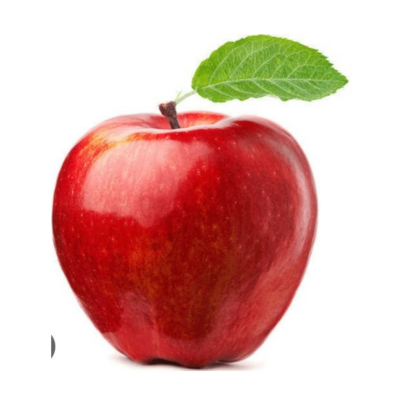

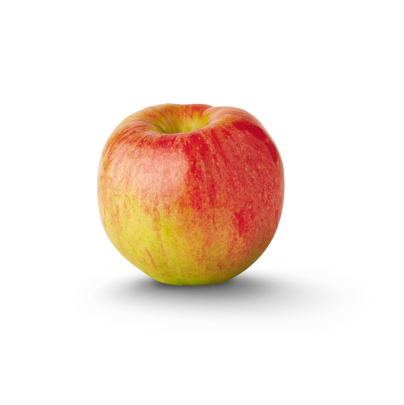

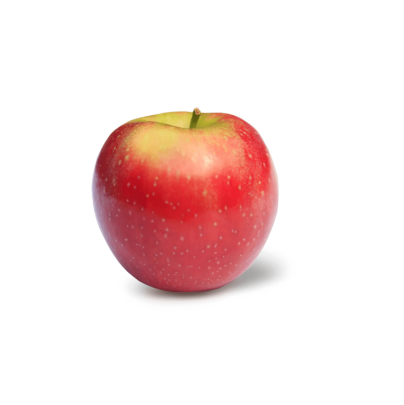

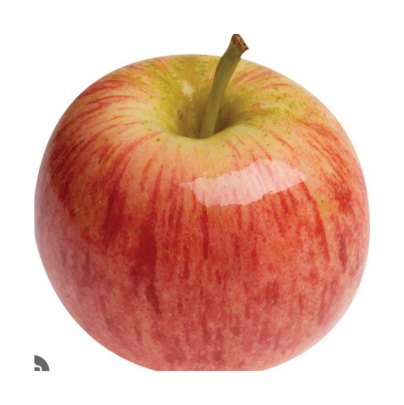

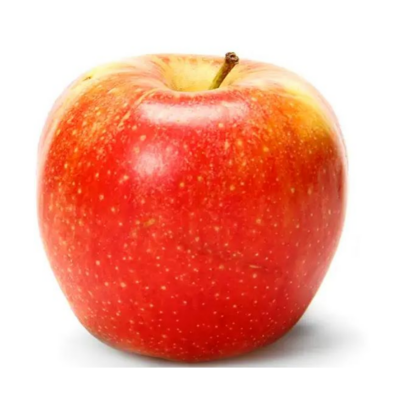

...

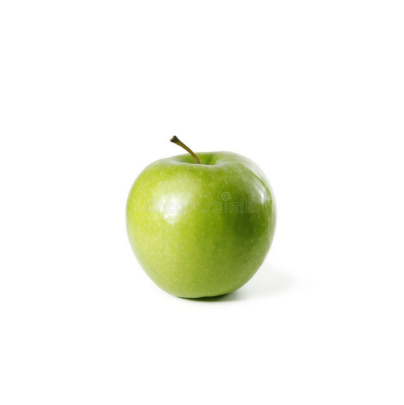

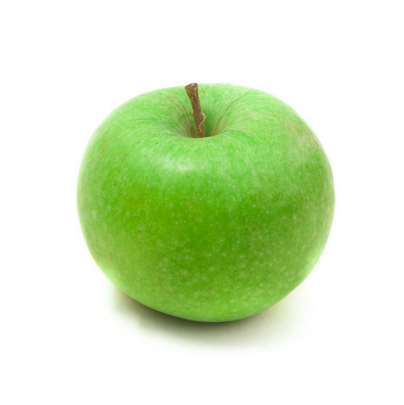

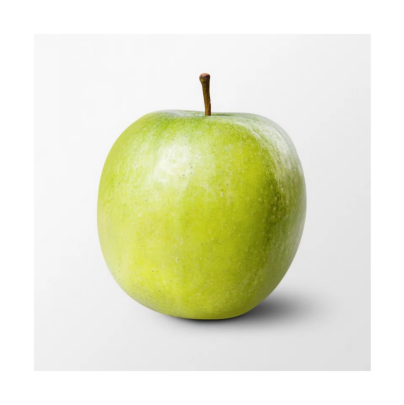

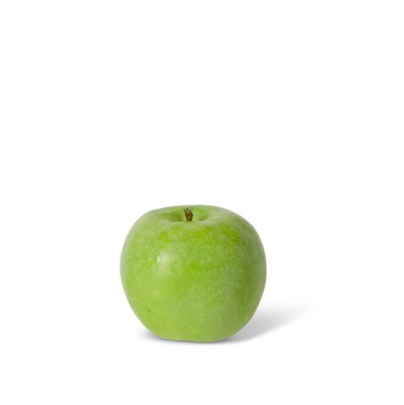

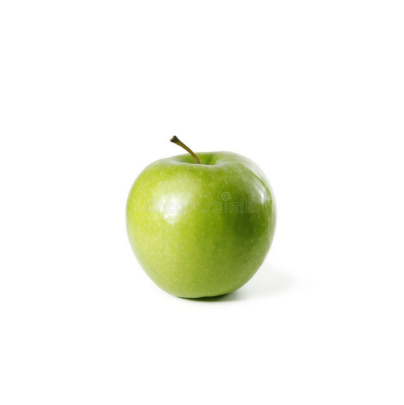

In [8]:
images = []  # Initialize an empty list to store processed images.

for image in get_slides(url):  # Retrieve and iterate over images from a Google Slides PDF.
    plot(image)  # Display each image using the plot function.
    images.append(load(image))  # Process each image and append to the images list.

images = torch.vstack(images)  # Stack images vertically into a single tensor.


In [9]:
images.shape  # Retrieve and display the shape of the tensor 'images'.

torch.Size([50, 3, 224, 224])

In [10]:
model(images)  # Pass the tensor 'images' through the model for inference.

tensor([[ 0.4443,  2.0072, -4.3706,  ...,  2.3789,  5.7556,  1.6945],
        [-0.7358,  1.8495, -4.3186,  ...,  3.5989,  6.1462,  1.1747],
        [-0.2815,  1.5831, -4.8476,  ...,  1.7328,  5.9631,  1.2664],
        ...,
        [-0.3546, -1.9235, -3.3981,  ...,  2.3181,  6.1364,  0.6488],
        [-2.0191, -1.0262, -4.6514,  ...,  1.0696,  4.4019,  0.4835],
        [ 0.2534, -0.8560, -2.3599,  ...,  1.8088,  5.1679,  0.1999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

In [11]:
y = model(images)  # Get model's output for the input tensor 'images'.

In [12]:
y.shape  # Retrieve and display the shape of the output tensor 'y'.

torch.Size([50, 1000])

In [13]:
guesses = torch.argmax(y, 1).cpu().numpy()  # Find max indices from model outputs and convert to numpy array.

In [14]:
for i in list(guesses):  # Iterate over predicted class indices.
    print(labels[i])  # Print the label corresponding to each index.

bell pepper
Granny Smith
pomegranate
fig
pomegranate
bell pepper
pomegranate
pomegranate
fig
spaghetti squash
buckeye, horse chestnut, conker
pomegranate
pomegranate
pomegranate
bell pepper
Granny Smith
pomegranate
pomegranate
punching bag, punch bag, punching ball, punchball
pomegranate
pomegranate
lipstick, lip rouge
bell pepper
pomegranate
pomegranate
Granny Smith
Granny Smith
Granny Smith
Granny Smith
Granny Smith
Granny Smith
Granny Smith
Granny Smith
Granny Smith
Granny Smith
Granny Smith
Granny Smith
Granny Smith
Granny Smith
Granny Smith
Granny Smith
Granny Smith
Granny Smith
Granny Smith
Granny Smith
Granny Smith
Granny Smith
Granny Smith
Granny Smith
Granny Smith


The provided loop iterates over the predicted class indices stored in the variable `guesses`. For each index, it retrieves the corresponding label from the `labels` dictionary and prints it to the console. This process effectively translates the model's output indices into human-readable class labels for interpretation.

In [15]:
Y = np.zeros(50,)  # Initialize an array of 50 zeros.
Y[25:] = 1  # Set the last 25 elements of the array to 1.

In [16]:
Y  # Display the contents of the array 'Y'.

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [17]:
X = y.detach().cpu().numpy()  # Detach 'y', move to CPU, and convert to numpy array.

The code detaches tensor `y`, moves it to the CPU, and converts it to a NumPy array. This process allows for further manipulation or analysis of the tensor data using NumPy's array functions and operations.

In [18]:
X.shape  # Retrieve and display the shape of the tensor 'X'.

(50, 1000)

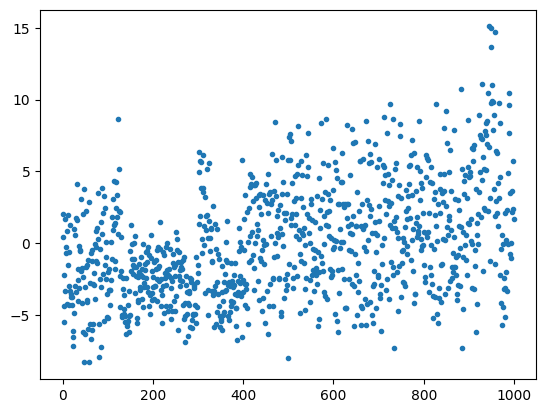

In [19]:
plt.plot(X[0], '.')  # Plot the first row of 'X' with dot markers.

The code plots the first row of the NumPy array `X` with dot markers using Matplotlib's `plot` function. This visualization provides a graphical representation of the values in the first row of the array, allowing for analysis of patterns or trends in the data.

In [20]:
X[0]  # Display the first row of the array 'X'.

array([ 4.44284558e-01,  2.00718141e+00, -4.37061930e+00, -5.45740795e+00,
       -2.22484779e+00,  1.69900870e+00, -3.29022932e+00, -6.93011940e-01,
       -2.66927481e-01, -4.23668528e+00,  8.75858188e-01, -1.49372816e+00,
        2.00187302e+00, -4.31227779e+00, -2.93907619e+00, -5.95183253e-01,
        1.27828336e+00, -3.28468132e+00, -3.52757287e+00, -3.71956086e+00,
       -3.75005794e+00, -4.29186296e+00, -6.51822662e+00, -6.13168144e+00,
       -7.14780092e+00, -4.81315613e+00,  1.01972032e+00,  6.09272957e-01,
       -2.98128295e+00,  1.74739420e+00, -3.40794849e+00,  4.10578871e+00,
        1.62706041e+00, -4.01502466e+00, -1.77244008e+00, -2.55140567e+00,
       -1.64538309e-01, -3.08691192e+00, -5.41768253e-01, -4.53040898e-01,
        3.08298445e+00, -1.93178272e+00, -4.11834526e+00, -1.69910884e+00,
       -2.37585759e+00, -6.15252018e+00,  2.03255391e+00,  3.77567244e+00,
       -8.25060654e+00, -6.33630419e+00, -3.00973606e+00,  2.25099659e+00,
       -1.65538669e+00, -

In [21]:
np.argmax(X[0])  # Find the index of the maximum value in the first row of 'X'.

945

In [22]:
labels[948]  # Retrieve and display the label associated with index 948.

'Granny Smith'

In [23]:
top_ten = np.argsort(X[0])[::-1][0:10]  # Get indices of top 10 values in the first row of 'X'.

In [24]:
for i in top_ten:  # Iterate over indices of top 10 values.
    print(labels[i])  # Print labels corresponding to each index.

bell pepper
Granny Smith
pomegranate
strawberry
ice cream, icecream
fig
vase
buckeye, horse chestnut, conker
cucumber, cuke
lemon


In [25]:
labels  # Display the entire dictionary of labels.

{0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma 

(array([ 26., 150., 261., 199., 170., 107.,  53.,  25.,   5.,   4.]),
 array([-8.29028797, -5.95244503, -3.61460185, -1.27675891,  1.06108415,
         3.39892721,  5.73677015,  8.07461357, 10.41245651, 12.75029945,
        15.0881424 ]),
 <BarContainer object of 10 artists>)

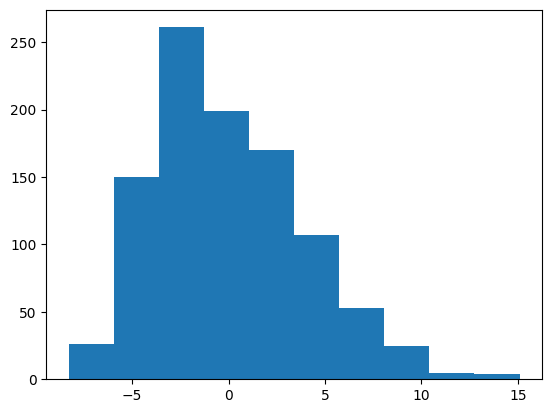

In [26]:
plt.hist(X[0])  # Plot a histogram of the values in the first row of 'X'.

The code plots a histogram of the values in the first row of the NumPy array `X` using Matplotlib's `hist` function. This visualization displays the distribution of values in the selected row, providing insights into the data's spread and frequency distribution.

In [27]:
X = GPU_data(X)  # Convert and move the numpy array 'X' to a GPU tensor without gradients.
Y = GPU_data(Y)  # Convert and move the numpy array 'Y' to a GPU tensor without gradients.

In [28]:
def softmax(x):
    s1 = torch.exp(x - torch.max(x, 1)[0][:, None])  # Compute the exponent of x minus the max value of x per row.
    s = s1 / s1.sum(1)[:, None]  # Normalize by dividing by the sum of exponents per row.
    return s  # Return the softmax-normalized tensor.

The `softmax` function computes the softmax activation for each row of the input tensor `x`. It first exponentiates each element of `x` after subtracting the maximum value in each row to prevent overflow. Then, it normalizes these exponentiated values by dividing by the sum of exponentials per row, producing a probability distribution over the elements of each row. Finally, it returns the softmax-normalized tensor.

In [29]:
def cross_entropy(outputs, labels):
    return -torch.sum(softmax(outputs).log()[range(outputs.size()[0]), labels.long()]) / outputs.size()[0]  # Compute the cross-entropy loss.

The `cross_entropy` function calculates the cross-entropy loss between the model outputs and the true labels. It first computes the softmax probabilities for the model outputs using the `softmax` function. Then, it extracts the logarithm of the softmax probabilities corresponding to the true labels and computes the negative sum of these logarithms. Finally, it divides this sum by the number of samples to obtain the average cross-entropy loss.

In [30]:
def Truncated_Normal(size):
    u1 = torch.rand(size)*(1-np.exp(-2)) + np.exp(-2)  # Generate truncated uniform random values.
    u2 = torch.rand(size)  # Generate uniform random values [0,1].
    z = torch.sqrt(-2 * torch.log(u1)) * torch.cos(2 * np.pi * u2)  # Apply Box-Muller transform for normal distribution.
    return z  # Return the generated truncated normal values.

The `Truncated_Normal` function generates truncated normal random values of a specified size. It first generates two sets of random values: `u1` as truncated uniform random values and `u2` as uniform random values between 0 and 1. Then, it applies the Box-Muller transform to `u1` and `u2` to produce values with a standard normal distribution. Finally, it returns the generated truncated normal values.

In [31]:
def acc(out, y):
    with torch.no_grad():  # Disable gradient computation for efficiency.
        return (torch.sum(torch.max(out, 1)[1] == y).item()) / y.shape[0]  # Calculate accuracy by comparing predictions to true labels.

The `acc` function computes the accuracy of the model predictions given the true labels. It first disables gradient computation for efficiency using `torch.no_grad()`. Then, it compares the indices of the maximum values in the `out` tensor (representing the predicted classes) with the true labels `y`. The function calculates the number of correct predictions and divides it by the total number of samples `y.shape[0]` to obtain the accuracy.

In [32]:
X.shape  # Retrieve and display the shape of the tensor 'X'.

torch.Size([50, 1000])

In [33]:
def get_batch(mode):
    b = c.b  # Retrieve batch size from configuration.
    if mode == "train":
        r = np.random.randint(X.shape[0]-b)  # Generate a random start index for training data.
        x = X[r:r+b,:]  # Slice training data batch from X.
        y = Y[r:r+b]  # Slice corresponding labels for the training batch.
    elif mode == "test":
        r = np.random.randint(X_test.shape[0]-b)  # Generate a random start index for test data.
        x = X_test[r:r+b,:]  # Slice test data batch from X_test.
        y = Y_test[r:r+b]  # Slice corresponding labels for the test batch.
    return x, y  # Return the batch of data and labels.

The `get_batch` function retrieves a batch of data and labels based on the specified mode (either "train" or "test"). It first retrieves the batch size `b` from the configuration. If the mode is "train," it generates a random start index for the training data and slices a batch of training data (`x`) and corresponding labels (`y`) from the global data arrays `X` and `Y`. Similarly, if the mode is "test," it generates a random start index for the test data and slices a batch of test data and labels from the global data arrays `X_test` and `Y_test`. Finally, it returns the batch of data (`x`) and labels (`y`).

In [34]:
def model(x, w):
    return x @ w[0]  # Perform matrix multiplication between input x and first weight matrix w[0].

The `model` function performs a linear transformation on the input `x` using the weight matrix `w[0]`. It conducts matrix multiplication between the input `x` and the first weight matrix `w[0]`, resulting in the output of the model. This operation represents the forward pass of a linear regression or a simple neural network layer.

In [35]:
def make_plots():
    acc_train = acc(model(x,w),y)  # Calculate training accuracy using the model, inputs x, weights w, and labels y.
    wb.log({"acc_train": acc_train})  # Log the training accuracy to Weights & Biases dashboard.

The `make_plots` function generates plots and logs training accuracy to the Weights & Biases dashboard. It calculates the training accuracy by invoking the `acc` function with inputs `model(x, w)` (representing model predictions), `x` (input data), `w` (model weights), and `y` (true labels). Subsequently, it logs the computed training accuracy under the key "acc_train" to the Weights & Biases dashboard for visualization and monitoring during model training.

In [36]:
! wandb login  # Command to log in to the Weights & Biases service.

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [37]:
wb.init(project="Linear_Model_Photo_1")  # Initialize a Weights & Biases project named "Linear_Model_Photo_1".

wandb: Currently logged in as: askinsj2022 (jacobaskins). Use `wandb login --relogin` to force relogin


In [38]:
c = wb.config  # Retrieve the configuration object from Weights & Biases.

c.h = 0.001  # Set the learning rate in the config.
c.b = 4  # Set the batch size in the config.
c.epochs = 100000  # Set the number of training epochs in the config.

w = [GPU(Truncated_Normal((1000,2)))]  # Create and move weights initialized with a truncated normal distribution to GPU.

optimizer = torch.optim.Adam(w, lr=c.h)  # Initialize the Adam optimizer with the weights and learning rate from config.

<ipython-input-2-c3d856de2607>:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(data, requires_grad=True, dtype=torch.float, device=torch.device('cuda'))


The code initializes the configuration object `c` retrieved from Weights & Biases, setting the learning rate (`c.h`), batch size (`c.b`), and number of training epochs (`c.epochs`). It then creates weights `w` initialized with a truncated normal distribution of shape (1000, 2) and moves them to the GPU. Finally, it initializes the Adam optimizer with the weights `w` and learning rate `c.h` specified in the configuration.

In [39]:
for i in range(c.epochs):  # Iterate over the number of epochs defined in config.
    x, y = get_batch('train')  # Get a batch of training data and labels.

    loss = cross_entropy(softmax(model(x, w)), y)  # Calculate loss using model output and true labels.

    optimizer.zero_grad()  # Clear previous gradients.
    loss.backward()  # Compute gradient of the loss with respect to model weights.
    optimizer.step()  # Update model weights based on computed gradients.

    wb.log({"loss": loss})  # Log the loss to Weights & Biases for tracking.

    make_plots()  # Function call to potentially plot results or additional metrics.

The provided loop iterates over the specified number of training epochs, fetching a batch of training data (`x`) and labels (`y`) using the `get_batch` function. It then computes the loss using the model output (`model(x, w)`) and true labels (`y`), followed by clearing previous gradients, computing gradients of the loss with respect to model weights, and updating the weights using the optimizer. The loss is logged to Weights & Biases for tracking, and the `make_plots` function may be called to visualize results or additional metrics.

The two graphs gathered from Weights & Balances exhibit consistent fluctuations, where they rapidly oscillate between high and low values, it could indicate instability in the training process. This instability might be caused by a variety of factors such as a high learning rate, insufficient data preprocessing, or an overly complex model architecture.

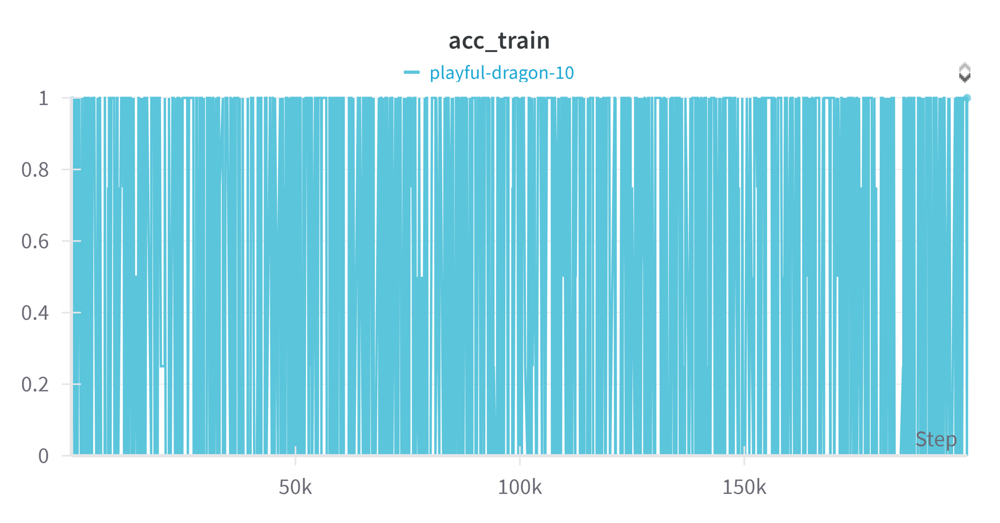![W&B Chart 4_24_2024, 8_17_05 PM.png]

The `acc_train` graph displayed on Weights & Biases provides a visual representation of the training accuracy as it changes over each epoch throughout the model's training process. This graph is crucial for monitoring performance improvements or identifying issues such as overfitting or underfitting, allowing developers to make informed decisions about adjustments to model training or architecture.

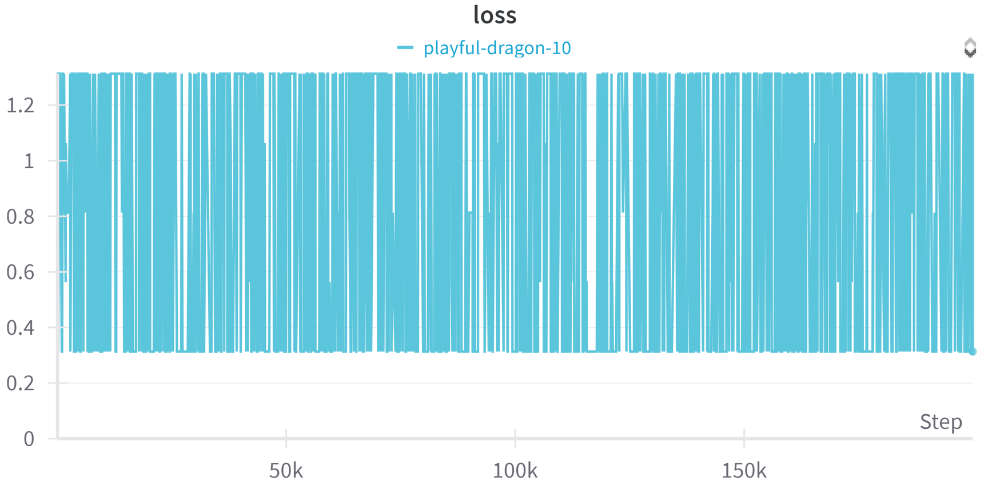

The `loss` graph on Weights & Biases tracks the model's loss metric over each epoch during the training process, visually depicting how the model's error decreases as it learns from the training data. This graph is essential for evaluating the effectiveness of the optimization algorithm, as a steadily decreasing loss curve typically indicates that the model is effectively learning and converging towards a minimum.